In [1]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import os

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

import kktk

In [2]:
sc.settings.set_figure_params(dpi=80)

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import scanpy as sc

def plot(adata, section_col, predicted_label_col, nrows, ncols, size=10, figsize=(12, 4)):
    samples = sorted(adata.obs[section_col].unique())
    niches = adata.obs[predicted_label_col].cat.categories
    
    for niche in niches:
        # Create binary annotation
        adata.obs["highlight_niche"] = np.where(
            adata.obs[predicted_label_col] == niche,
            niche,
            "Other"
        )
        
        fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
        axes = axes.flatten()
        
        for i, sample in enumerate(samples):
            ax = axes[i]
            slide = adata[adata.obs[section_col] == sample].copy()
        
            sc.pl.embedding(
                slide,
                basis="spatial",
                color="highlight_niche",
                palette={niche: "#722F37", "Other": "lightgrey"},
                ax=ax,
                show=False,
                title=sample,
                size=size
            )
        
            # remove legend per subplot
            if ax.get_legend() is not None:
                ax.get_legend().remove()
        
            ax.set_aspect("equal")
        
        # turn off unused panels
        for j in range(len(samples), 3):
            axes[j].axis("off")
        
        # global title
        fig.suptitle(niche, fontsize=20, y=0.98)
        
        plt.tight_layout()
        plt.show()

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_section_guide(slide):
    xy = slide.obsm["spatial"]

    plt.figure(figsize=(5, 5))
    sns.scatterplot(
        x=xy[:, 0],
        y=xy[:, 1],
        s=1,
        linewidth=0
    )

    plt.gca().invert_yaxis()  # important for image coordinates
    plt.xlabel("x")
    plt.ylabel("y")
    plt.title("Section footprint")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

In [5]:
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

def add_xenium_scalebar(
    ax,
    length_um=500,
    location="lower right",
    linewidth=3,
    fontsize=8,
    pad=0.4,
):
    """Add a scale bar to a Xenium plot whose coordinates are in µm."""
    
    fontprops = fm.FontProperties(size=fontsize)

    scalebar = AnchoredSizeBar(
        ax.transData,
        length_um,                  # coordinate units; Xenium uses µm
        f"{length_um:g} µm",
        location,
        pad=pad,
        color="black",
        frameon=False,
        size_vertical=linewidth,
        fontproperties=fontprops,
    )

    ax.add_artist(scalebar)

In [6]:
figdir = '/Users/kazumasakanemaru/Data_kk/Foetal_ms_raw_plots_from-mac/'

# Read in adata

In [7]:
# adata predicted labels from the no1 notebook 
adata = sc.read_h5ad("/Users/kazumasakanemaru/GitHub/anndata/Xenium5K/results/eval_Xenium5K_demo/Xenium5K_predicted_cells.h5ad")
adata

AnnData object with n_obs × n_vars = 341592 × 5001
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'tissue_block_id', 'fine_grain_17Apr2026', 'coarse_grain_17Apr2026', 'sliding_window_assignment', 'tt_coarse_label', 'tt_coarse_score', 'tt_fine_label', 'tt_fine_score', 'tt_joint_score', 'tt_final_label', 'tt_low_conf', 'tt_stage2a_score', 'tt_vasc2a_score', 'tt_ventricle_label', 'tt_ventricle_score', 'tt_avjunction_label', 'tt_avjunction_score', 'tt_atrium_split_label', 'tt_atrium_split_score', 'tt_atrium_transitional_label', 'tt_atrium_transitional_score', 'tt_atrium_lr_label', 'tt_atrium_lr_score', 'tt_pcs_split_label', 'tt_pcs_split_score', 'tt_pcs_sinoatrial_label', 'tt_pcs_s

# Plotting

In [9]:
palette_niches = {
    'Atrium - Left': '#1f77b4',
    'Atrium - Right': '#ff7f0e',
    'Atrium - Transitional': '#2ca02c',

    'Sinus horn': '#d62728',
    'SA node - Head': '#9467bd',
    'SA node - Tail': '#8c564b',
    'AV nodal region': '#e377c2',
    'AV ring': '#f7b6d2',

    'Endocardial cushion - Valve': '#7f7f7f',

    'Ventricle - Compact': '#bcbd22',
    'Ventricle - Trabeculated': '#17becf',

    'VCS - Proximal': '#aec7e8',
    'VCS - Distal': '#ffbb78',

    'Endocardium - Atrial': '#c7e9c0', 
    'Endocardium - Ventricular': '#98df8a',

    'Great vessel': '#ff9896',
    'Ductus arteriosus': '#c5b0d5',
    'Coronary vessel': '#c49c94',

    'Connective tissue': '#f7b6d2',
    'Epicardial region': '#c7c7c7',
}


In [10]:
# remove intermediate terms (falled back labels)
ndata = adata[adata.obs["tt_final_label"].isin(['AV junction',
 'Atrium',
 'Great vessels',
 'Lymph node',
 'Pacemaker conduction system',
 'Sinoatrial region',
 'Vasculature',
 'Ventricle'])==False]
ndata.shape

(337996, 5001)

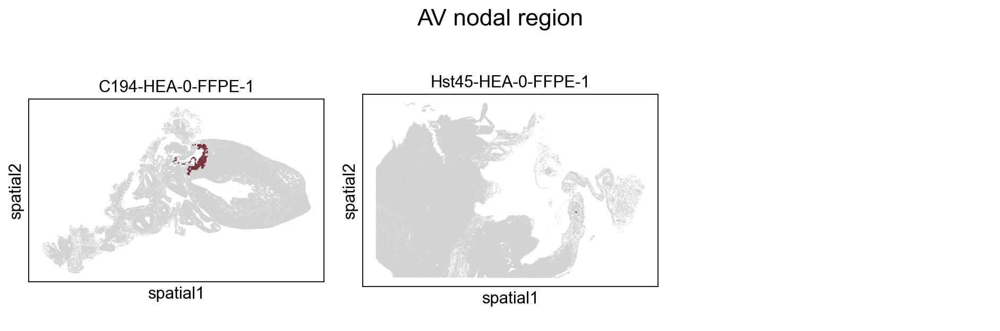

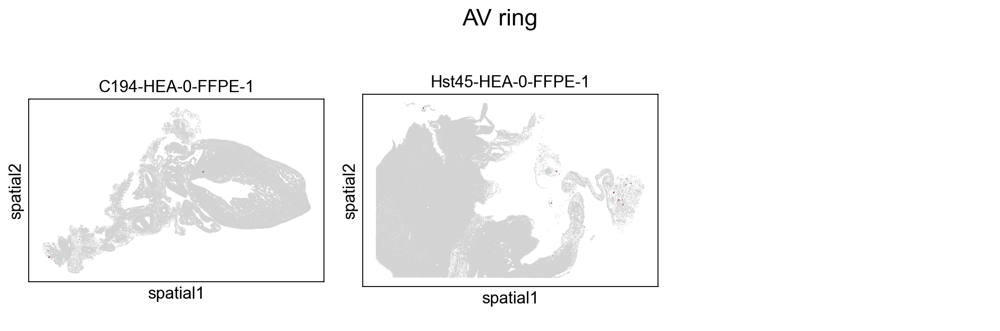

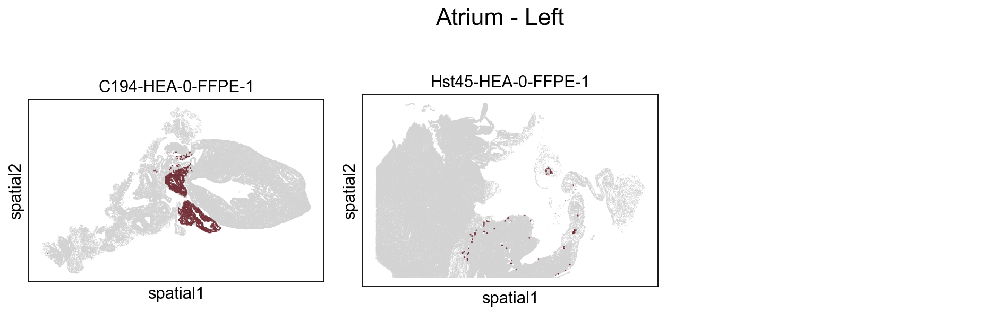

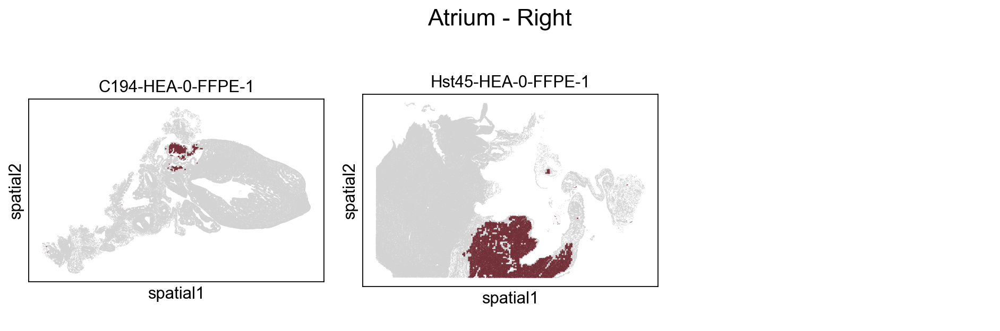

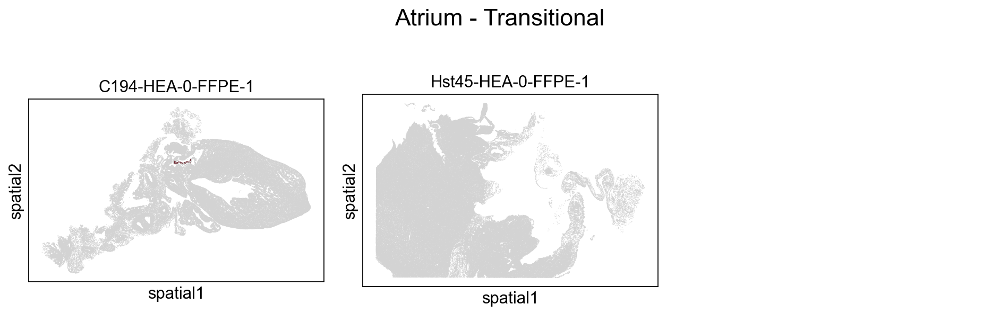

...

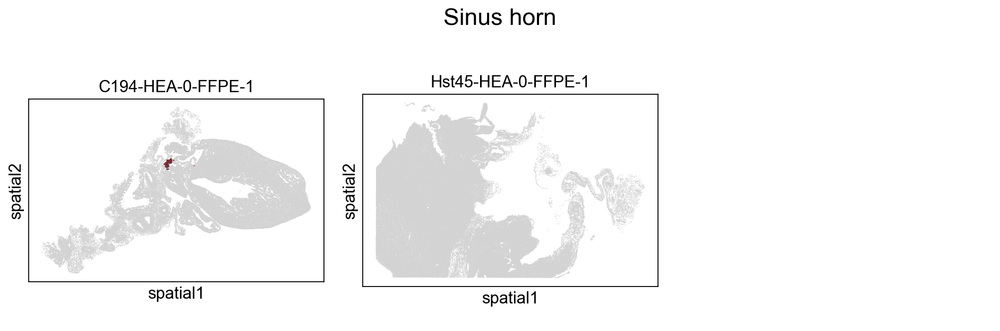

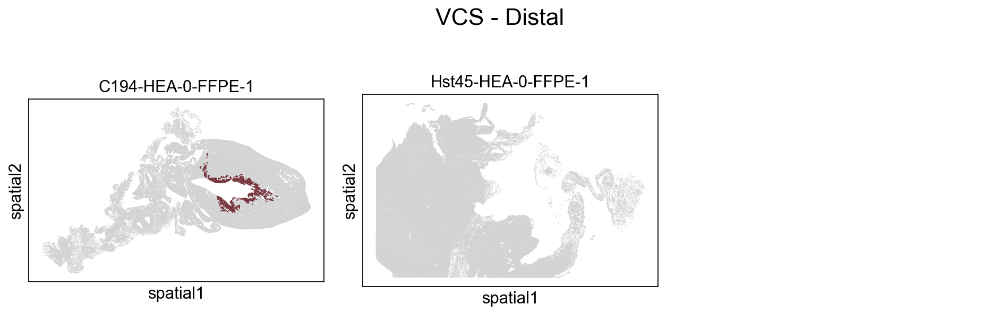

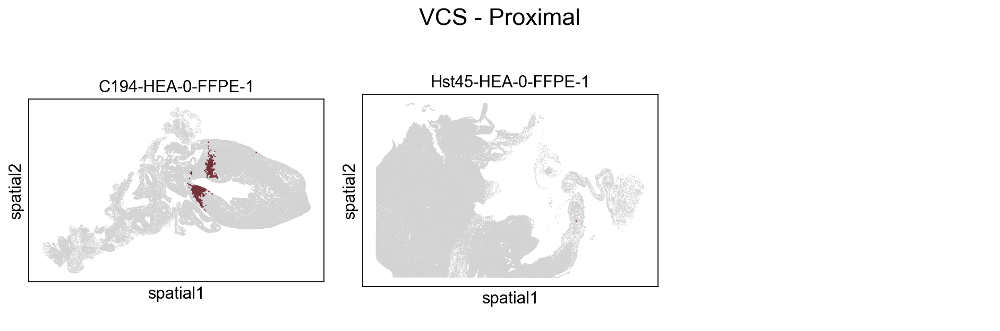

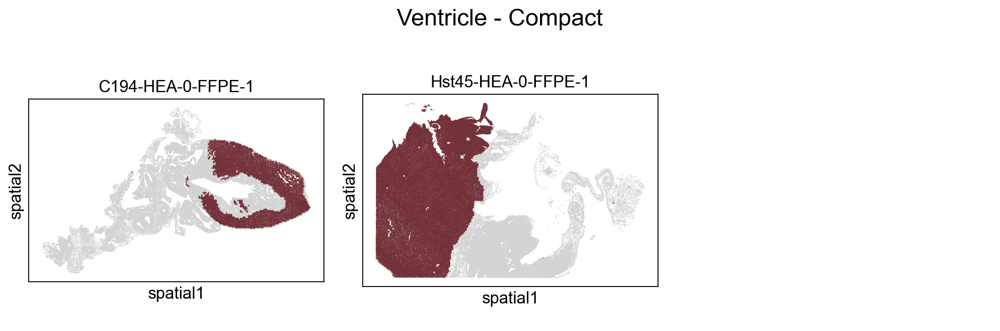

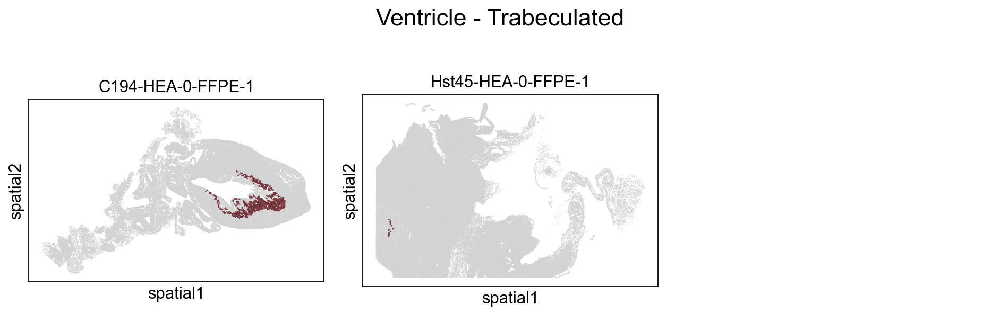

In [11]:
plot(ndata, 
    section_col = "tissue_block_id",
     predicted_label_col = 'tt_final_label',
     size = 1,
     nrows = 1, ncols = 3, figsize=(12, 4)
    )

In [12]:
celltypes_sel = [
    # '?EpendymalCells',
 # '?EpithelialCells',
 # '?SkeletalMuscle',
 # '?ThyroidCells',
 'AtrialCardiomyocytesCycling',
 'AtrialCardiomyocytesLeft',
 'AtrialCardiomyocytesRight',
 # 'AtrialCardiomyocytes_DoubletWithEC',
 # 'AtrialCardiomyocytes_DoubletWithFB',
 'AtrioventricularNodePacemakerCells',
 'BCells',
 'ChromaffinCells',
 'CoronaryArterialEndothelialCells',
 'CoronaryCapillaryEndothelialCells',
 'CoronaryCapillaryEndothelialCellsCycling',
 'CoronaryCapillaryEndothelialCellsNOTCHpos',
 # 'CoronaryCapillaryEndothelialCells_DoubletsWithEryth',
 'CoronaryPericytes',
 'CoronarySmoothMuscleCells',
 'CoronaryVenousEndothelialCells',
 'DendriticCells',
 'DuctusArteriosusSmoothMuscleCells',
 'EndocardialCells',
 'EndocardialCellsCycling',
 # 'EndocardialCells_Doublets',
 'EndocardialCushionCells',
 # 'EntericLikeNeurons',
 'EpicardiumDerivedCells',
 # 'Erythrocytes',
 # 'ErythrocytesCycling',
 'Fibroblasts',
 'FibroblastsCOL2A1pos',
 'FibroblastsCycling',
 'GreatVesselArterialEndothelialCells',
 'GreatVesselSmoothMuscleCells',
 'GreatVesselSmoothMuscleCellsCycling',
 'GreatVesselVenousEndothelialCells',
 'InnateLymphoidCells',
 'LymphaticEndothelialCells',
 'MacrophagesCX3CR1pos',
 'MacrophagesLYVE1pos',
 'MastCells',
 'Megakaryocytes',
 'MesothelialEpicardialCells',
 'Monocytes',
 # 'MyeloidCells_Doublets',
 'NeuronPrecursors',
 'ParasympatheticNeurons',
 'PericardialCellsCycling',
 'PericardialCellsFibrous',
 'PericardialCellsIntermediate',
 # 'SOX2_LAMB3_pos',
 'SchwannCellPrecursors',
 'SchwannCells',
 'SchwannCellsCycling',
 # 'SchwannCells_DoubletsWithNeurons',
 'SinoatrialNodePacemakerCells',
 'SympatheticNeurons',
 'TCellsCD4pos',
 'TCellsCD8pos',
 # 'ThyroidEpithelialCells',
 'ValveEndothelialCells',
 'VentricularCardiomyocytes',
 'VentricularCardiomyocytesCycling',
 'VentricularConductionSystemDistal',
 # 'doublets',
 # 'unassigned',
 # 'unclassified'
]

In [18]:
celltypes_sel = [
    # '?EpendymalCells',
 # '?EpithelialCells',
 # '?SkeletalMuscle',
 # '?ThyroidCells',
    'ArterialEndothelialCells',
 'AtrialCardiomyocytesCycling',
 'AtrialCardiomyocytesLeft',
 'AtrialCardiomyocytesRight',
    'AtrialCardiomyocytesTransitional',
 # 'AtrialCardiomyocytes_DoubletWithEC',
 # 'AtrialCardiomyocytes_DoubletWithFB',
 'AtrioventricularNodePacemakerCells',
 'BCells',
 'ChromaffinCells',
 'CoronaryCapillaryEndothelialCells',
 # 'CoronaryCapillaryEndothelialCells_DoubletsWithEryth',
 'CoronaryPericytes',
 'CoronarySmoothMuscleCells',
 'CoronaryVenousEndothelialCells',
 'DuctusArteriosusSmoothMuscleCells',
 'EndocardialCells',
 # 'EndocardialCells_Doublets',
 'EndocardialCushionCells',
 # 'EntericLikeNeurons',
 'EpicardiumDerivedCells',
 # 'Erythrocytes',
 # 'ErythrocytesCycling',
 'Fibroblasts',
 'GreatVesselSmoothMuscleCells',
 'GreatVesselVenousEndothelialCells',
 'InnateLymphoidCells',
 'LymphaticEndothelialCells',
 'MacrophagesCX3CR1pos',
 'MacrophagesLYVE1pos',
    'MacrophagesCycling',
 'MastCells',
 'MesothelialEpicardialCells',
 'Monocytes',
 # 'MyeloidCells_Doublets',
 'NeuralCellsCycling',
 'NeuronPrecursors',
'PacemakerCellsCycling',
 'ParasympatheticNeurons',
 # 'SOX2_LAMB3_pos',
 'SchwannCellPrecursors',
 'SchwannCells',
 # 'SchwannCells_DoubletsWithNeurons',
 'SinoatrialNodePacemakerCells',
 'SympatheticNeurons',
 'TCellsCD4pos ',
 'TCellsCD8pos',
 # 'ThyroidEpithelialCells',
 'VentricularCardiomyocytes',
 'VentricularCardiomyocytesCycling',
 'VentricularConductionSystemDistal',
 # 'doublets',
 # 'unassigned',
 # 'unclassified'
]
cdata = adata[adata.obs['fine_grain_17Apr2026'].isin(celltypes_sel)]

In [19]:
set(adata.obs['fine_grain_17Apr2026']) - set(celltypes_sel)

{nan}

In [20]:
set(ndata.obs["tissue_block_id"])

{'C194-HEA-0-FFPE-1', 'Hst45-HEA-0-FFPE-1'}

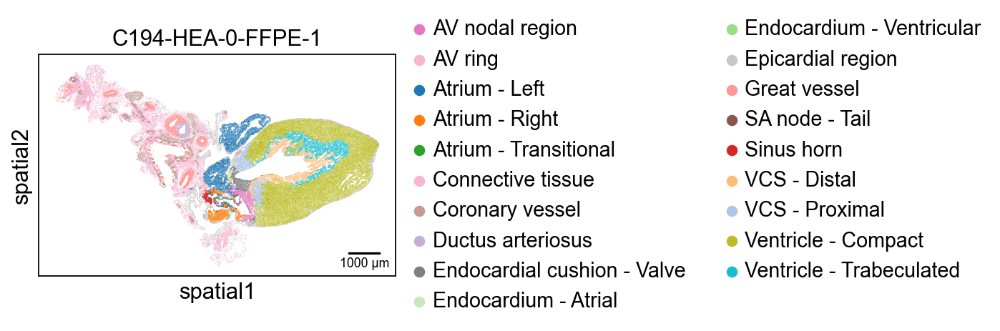

In [21]:
section_id = 'C194-HEA-0-FFPE-1'
slide = ndata[ndata.obs["tissue_block_id"] == section_id].copy()
axs = sc.pl.spatial(
                slide,
                color="tt_final_label", palette = palette_niches,
                show=False,
                title=section_id,
                spot_size=15
            )
ax = axs[0] if isinstance(axs, list) else axs

add_xenium_scalebar(
    ax,
    length_um=1000,
    location="lower right",
)

plt.savefig(f'{figdir}/xenium5k_whole-heart_TT-niche-labels_{section_id}_with-scale.pdf', bbox_inches="tight", dpi=300)

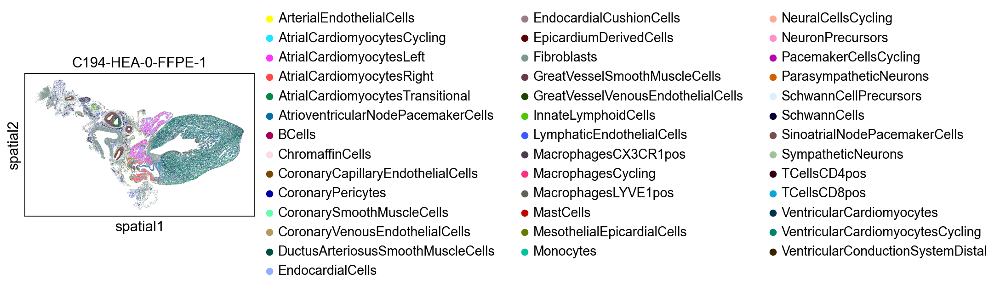

In [22]:
section_id = 'C194-HEA-0-FFPE-1'
slide = cdata[cdata.obs["tissue_block_id"] == section_id].copy()
sc.pl.spatial(
                slide,
                color='fine_grain_17Apr2026', # palette = palette_niches,
                show=False,
                title=section_id,
                spot_size=15
            )
plt.savefig(f'{figdir}/xenium5k_whole-heart_finegrain-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)

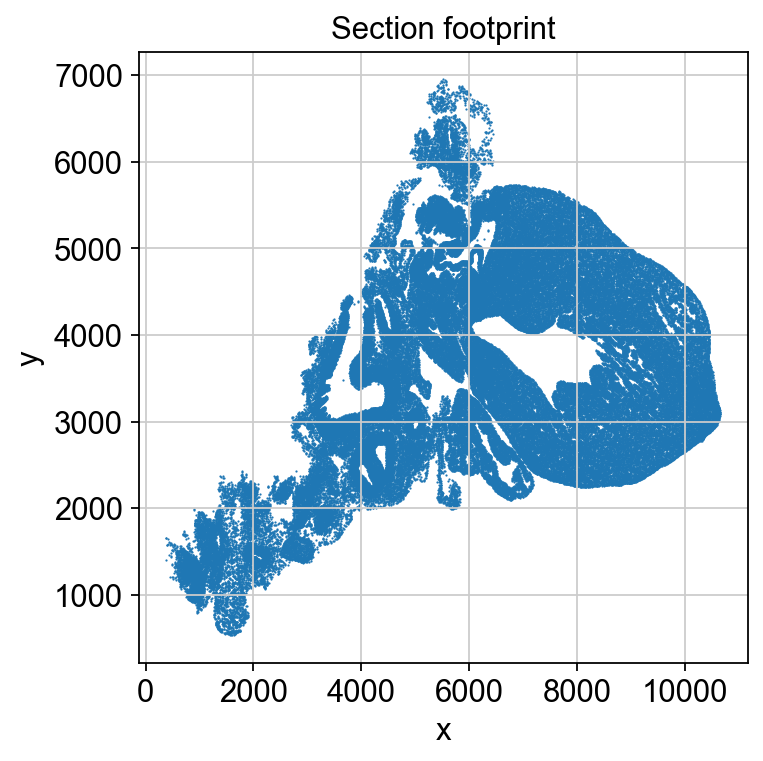

In [23]:
plot_section_guide(slide)

In [37]:
palette_cells = {
    # --- CCS (LOCKED / aligned)
    'SinoatrialNodePacemakerCells': '#1f77b4',
    'AtrioventricularNodePacemakerCells': '#d62728',
    'VentricularConductionSystemDistal': '#c5b0d5',
    'PacemakerCellsCycling':'#9467bd',

    # --- Atrial cardiomyocytes (blues)
    'AtrialCardiomyocytesLeft': '#9ecae1',
    'AtrialCardiomyocytesRight': '#c6dbef',
    'AtrialCardiomyocytesCycling': '#6baed6',
    'AtrialCardiomyocytesTransitional':'#deebf7',

    # --- Ventricular cardiomyocytes (greens)
    'VentricularCardiomyocytes': '#74c476',
    'VentricularCardiomyocytesCycling': '#bae4b3',

    # --- Endothelial (reds / salmon)
    'ArterialEndothelialCells': '#fb6a4a',
    'CoronaryVenousEndothelialCells': '#fcae91',
    'CoronaryCapillaryEndothelialCells': '#fdd0a2',
    'GreatVesselVenousEndothelialCells': '#fb9a99',
    'LymphaticEndothelialCells': '#fcbba1',
    'EndocardialCells': '#fc9272',

    # --- Cushion / developmental intermediates
    'EndocardialCushionCells': '#f4a582',

    # --- Epicardial / mesothelial (cyan)
    'EpicardiumDerivedCells': '#00bcd4',
    'MesothelialEpicardialCells': '#80deea',

    # --- Fibroblasts (brown)
    'Fibroblasts': '#8c564b',

    # --- Smooth muscle / perivascular (olive)
    'CoronarySmoothMuscleCells': '#bcbd22',
    'CoronaryPericytes': '#9edae5',
    'GreatVesselSmoothMuscleCells': '#dbdb8d',
    'DuctusArteriosusSmoothMuscleCells': '#9c9e5c',

    # --- Neural (pink family)
    'ParasympatheticNeurons': '#e377c2',
    'SympatheticNeurons': '#f7b6d2',
    'NeuronPrecursors': '#f4a3c4',
    'SchwannCells': '#f2a7d8',
    'SchwannCellPrecursors': '#f9d5ec',
    'ChromaffinCells': '#ff99cc',
    'NeuralCellsCycling': '#d9a6d2',

    # --- Immune (greyscale)
    'MacrophagesCX3CR1pos': '#4d4d4d',
    'MacrophagesLYVE1pos': '#636363',
    'MacrophagesCycling': '#525252',
    'Monocytes': '#252525',
    'BCells': '#6b6b6b',
    'TCellsCD4pos ': '#7f7f7f',
    'TCellsCD8pos': '#969696',
    'InnateLymphoidCells': '#737373',
    'MastCells': '#8c8c8c',
}

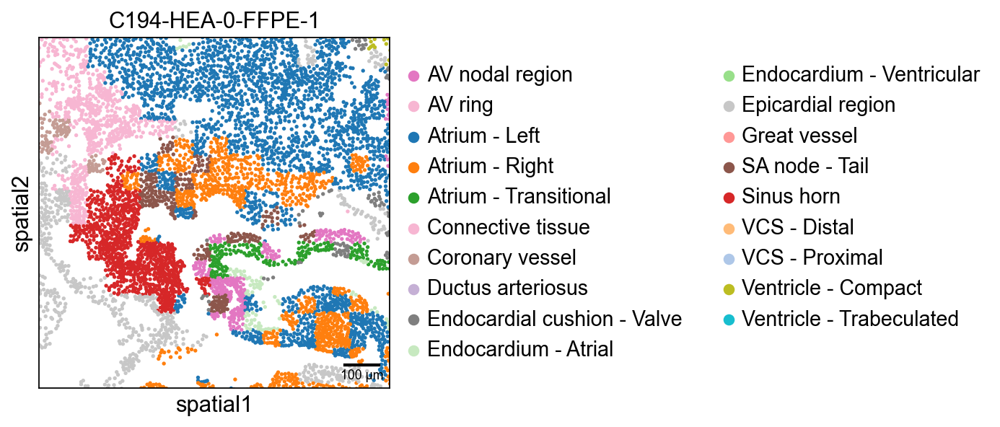

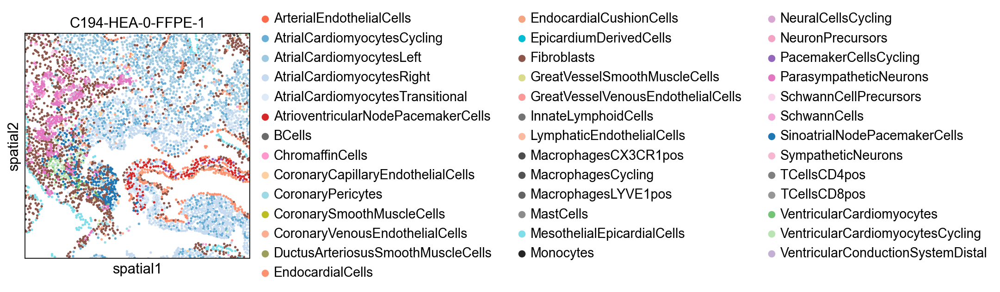

In [38]:
section_id = 'C194-HEA-0-FFPE-1'
crop_coord = (4900,5900,4200,5200)

slide = ndata[ndata.obs["tissue_block_id"] == section_id].copy()
axs = sc.pl.spatial(
                slide,
                color="tt_final_label", palette = palette_niches,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )
ax = axs[0] if isinstance(axs, list) else axs
add_xenium_scalebar(
    ax,
    length_um=100,
    location="lower right",
)
plt.savefig(f'{figdir}/xenium5k_SAN-zoom_niche-labels_{section_id}_with-scale.pdf', bbox_inches="tight", dpi=300)

slide = cdata[cdata.obs["tissue_block_id"] == section_id].copy()
sc.pl.spatial(
                slide,
                color=['fine_grain_17Apr2026'], palette=palette_cells,
                ncols=1,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )
plt.savefig(f'{figdir}/xenium5k_SAN-zoom_finegrain-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)

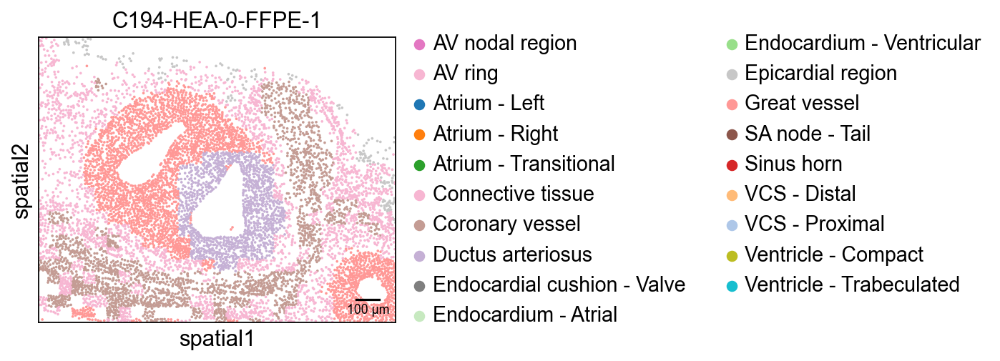

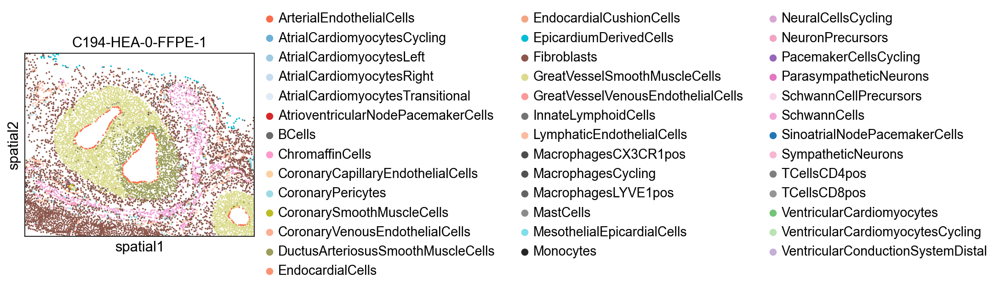

In [39]:
section_id = 'C194-HEA-0-FFPE-1'
crop_coord = (3600,5100,1900,3100)

slide = ndata[ndata.obs["tissue_block_id"] == section_id].copy()
axs = sc.pl.spatial(
                slide,
                color="tt_final_label", palette = palette_niches,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )
ax = axs[0] if isinstance(axs, list) else axs
add_xenium_scalebar(
    ax,
    length_um=100,
    location="lower right",
)
plt.savefig(f'{figdir}/xenium5k_GV-zoom_niche-labels_{section_id}_with-scale.pdf', bbox_inches="tight", dpi=300)

slide = cdata[cdata.obs["tissue_block_id"] == section_id].copy()
sc.pl.spatial(
                slide,
                color=['fine_grain_17Apr2026'], palette=palette_cells,
                ncols=1,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )
plt.savefig(f'{figdir}/xenium5k_GV-zoom_finegrain-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)

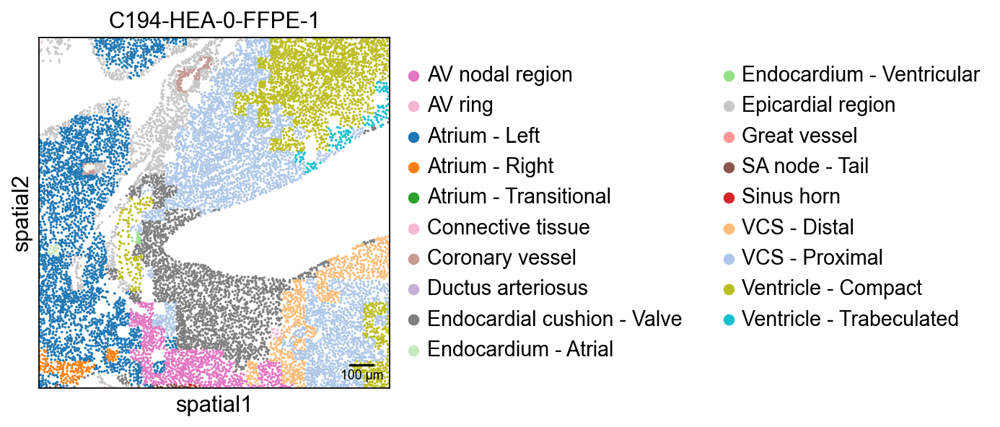

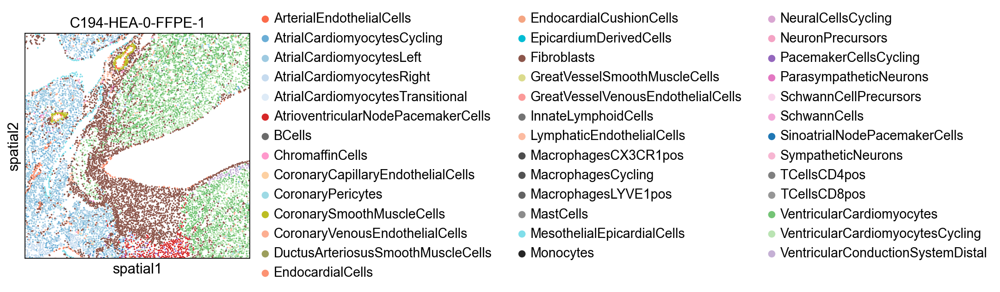

In [40]:
section_id = 'C194-HEA-0-FFPE-1'
crop_coord = (5500,7000,3200,4700)

slide = ndata[ndata.obs["tissue_block_id"] == section_id].copy()
axs = sc.pl.spatial(
                slide,
                color="tt_final_label", palette = palette_niches,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )
ax = axs[0] if isinstance(axs, list) else axs
add_xenium_scalebar(
    ax,
    length_um=100,
    location="lower right",
)
plt.savefig(f'{figdir}/xenium5k_Valve-zoom_niche-labels_{section_id}_with-scale.pdf', bbox_inches="tight", dpi=300)

slide = cdata[cdata.obs["tissue_block_id"] == section_id].copy()
sc.pl.spatial(
                slide,
                color=['fine_grain_17Apr2026'], palette=palette_cells,
                ncols=1,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=11
            )
plt.savefig(f'{figdir}/xenium5k_Valve-zoom_finegrain-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)

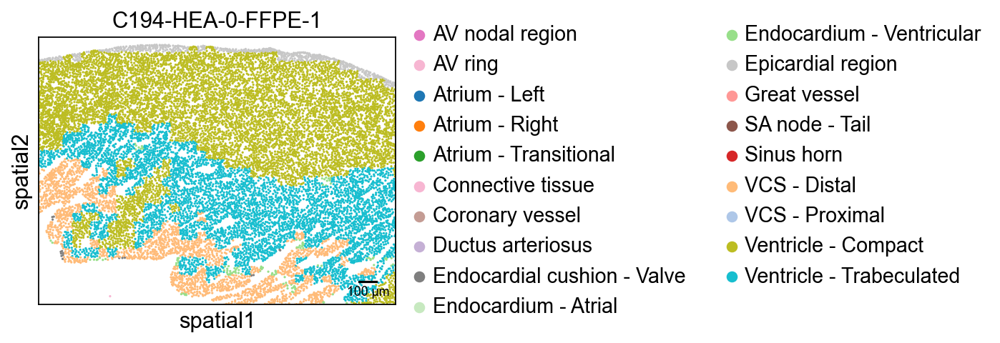

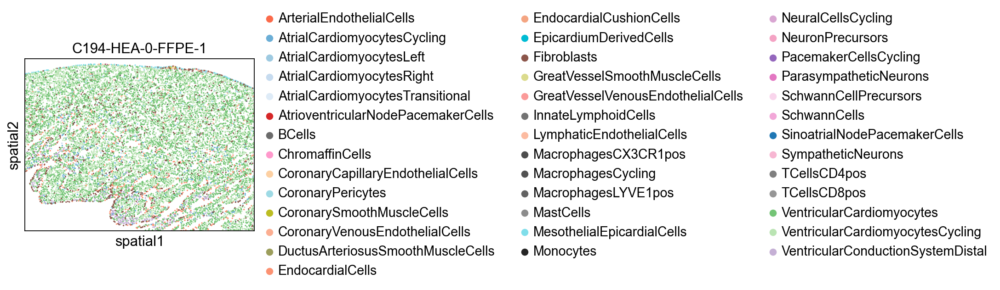

In [41]:
section_id = 'C194-HEA-0-FFPE-1'
crop_coord = (7500,9500,2200,3700)

slide = ndata[ndata.obs["tissue_block_id"] == section_id].copy()
axs = sc.pl.spatial(
                slide,
                color="tt_final_label", palette = palette_niches,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=13
            )
ax = axs[0] if isinstance(axs, list) else axs
add_xenium_scalebar(
    ax,
    length_um=100,
    location="lower right",
)
plt.savefig(f'{figdir}/xenium5k_Ventricle-zoom_niche-labels_{section_id}_with-scale.pdf', bbox_inches="tight", dpi=300)

slide = cdata[cdata.obs["tissue_block_id"] == section_id].copy()
sc.pl.spatial(
                slide,
                color=['fine_grain_17Apr2026'], palette=palette_cells,
                ncols=1,
                crop_coord=crop_coord,
                show=False,
                title=section_id,
                spot_size=13
            )
plt.savefig(f'{figdir}/xenium5k_Ventricle-zoom_finegrain-labels_{section_id}.pdf', bbox_inches="tight", dpi=300)